In [1]:
import pandas as pd
import datetime
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
data=pd.read_csv('C:\\Users\\Admin\\OneDrive\\Desktop\\HPE\\feature_seln_new123.csv')

In [2]:
data.shape

(2952, 43)

In [3]:
data['START_TIME'] = pd.to_datetime(data['START_TIME'])

In [4]:
df=data[data.columns[1:]].round(4)
df=df.set_index('START_TIME')

In [5]:
df.shape

(2952, 41)

In [6]:
from matplotlib import style
plt.style.use('ggplot')

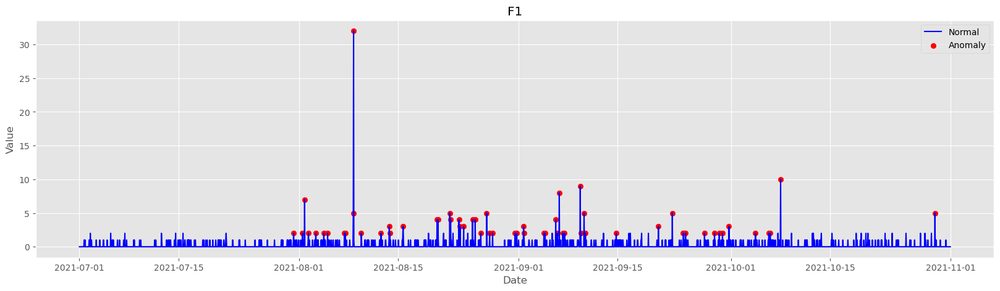

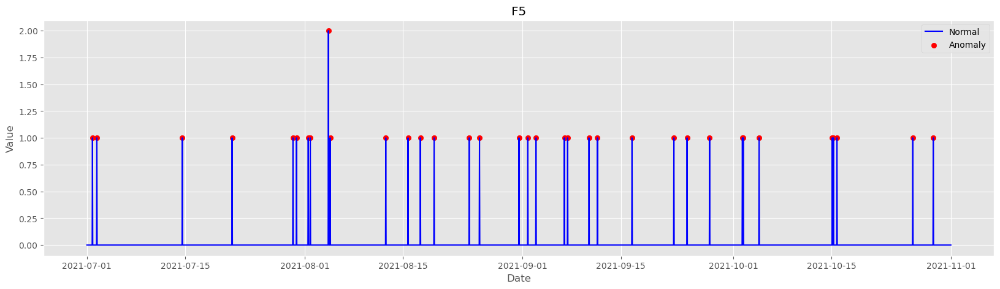

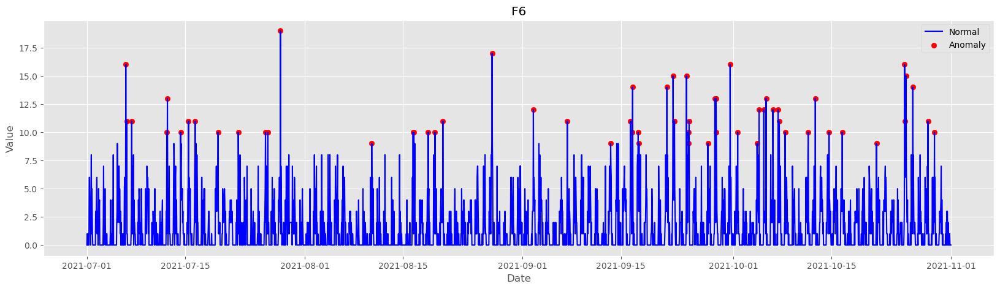

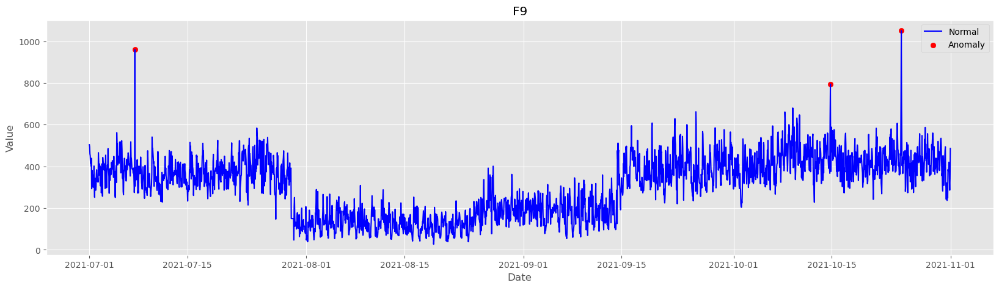

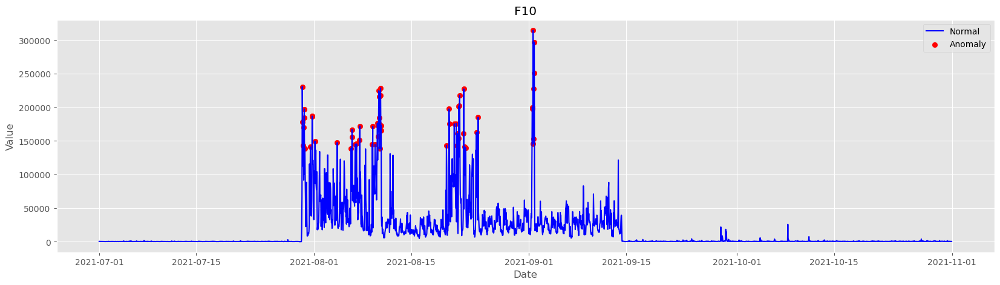

...

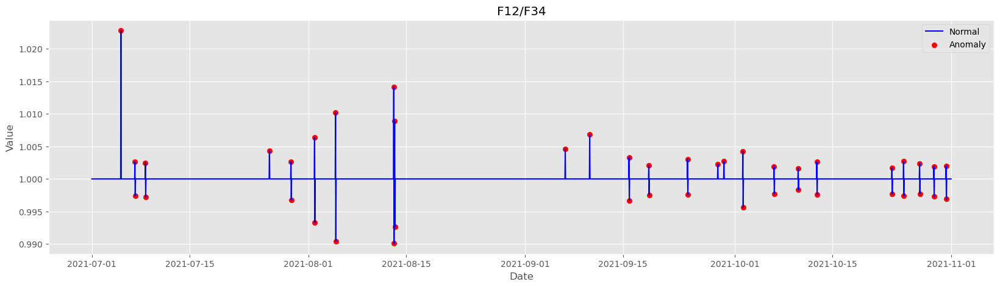

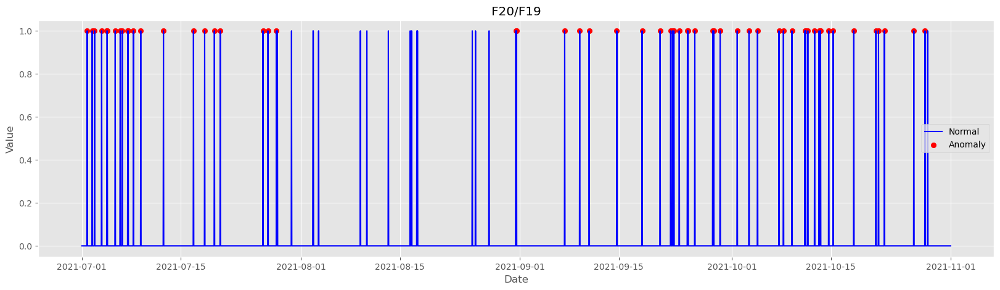

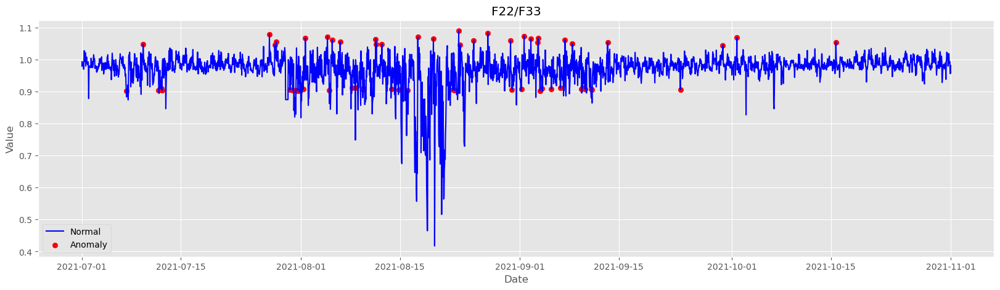

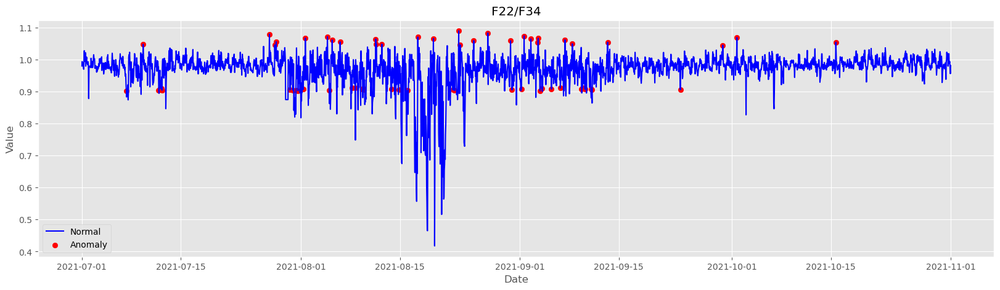

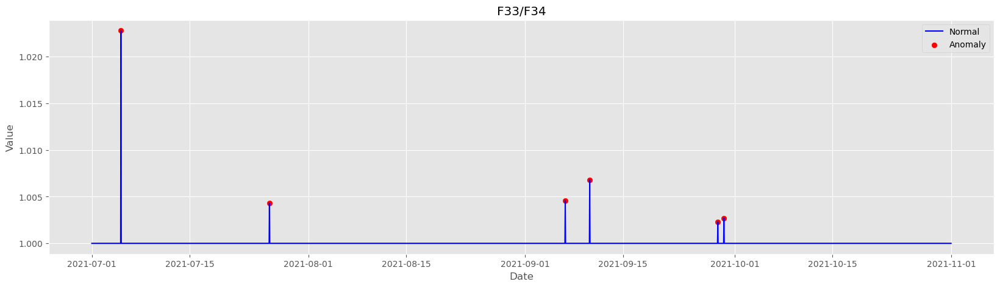

In [7]:
#IQR METHOD
for col in df.columns:
    
    Q3 = np.quantile(df[col], 0.75)
    Q1 = np.quantile(df[col], 0.25)
    IQR = Q3 - Q1

    
    lower_bound = (Q1 - 1.5* IQR)
    upper_bound = (Q3 + 1.5* IQR)
    
   
    #detecting outliers
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by=col, ascending = False).head(top_n)
    
    
    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    
    col_name = col.replace("/", " divided by ")
    plt.savefig(col_name + '_iqr_plot.png')
    
    plt.show()

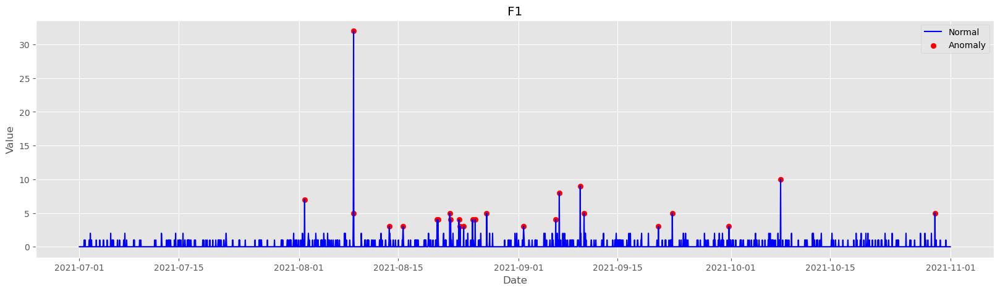

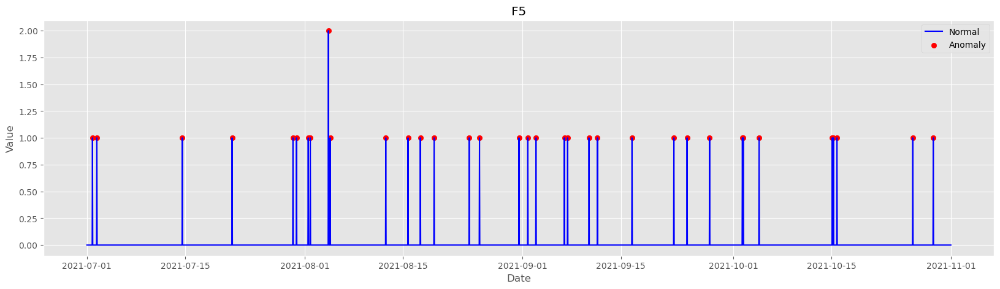

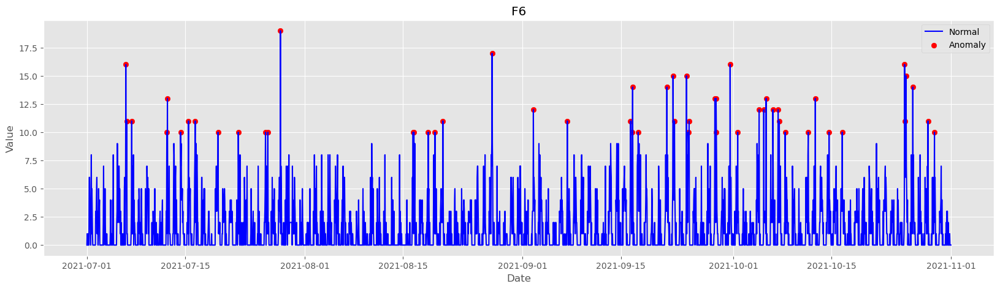

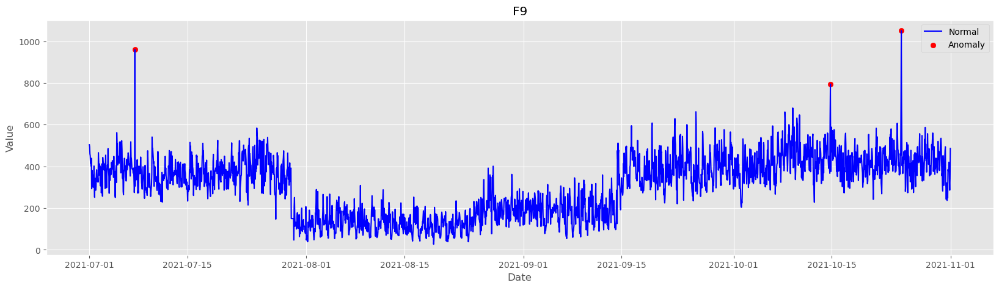

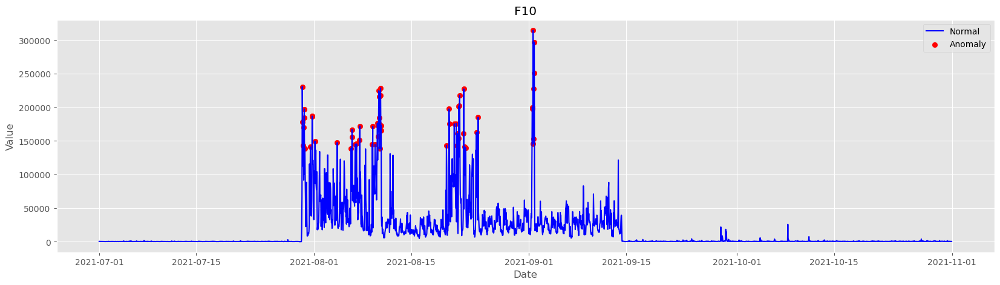

...

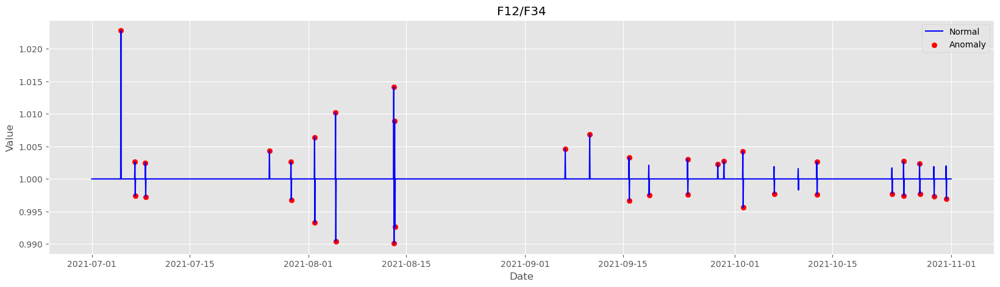

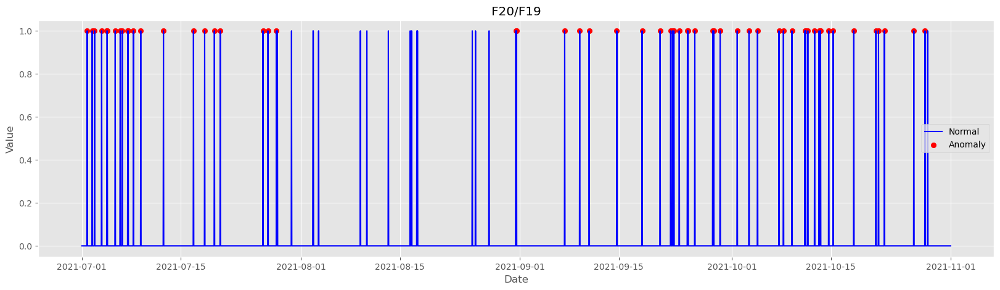

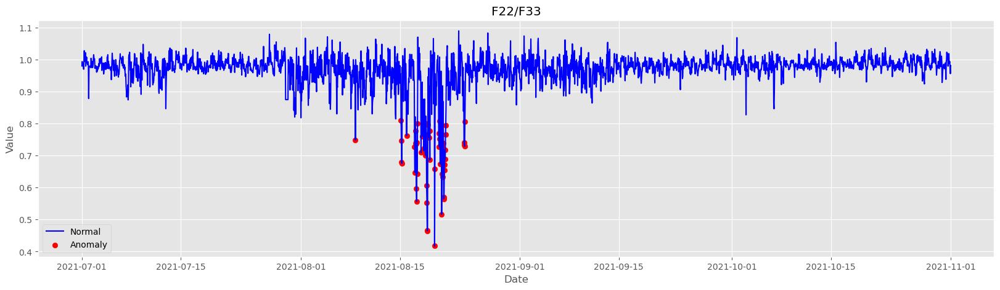

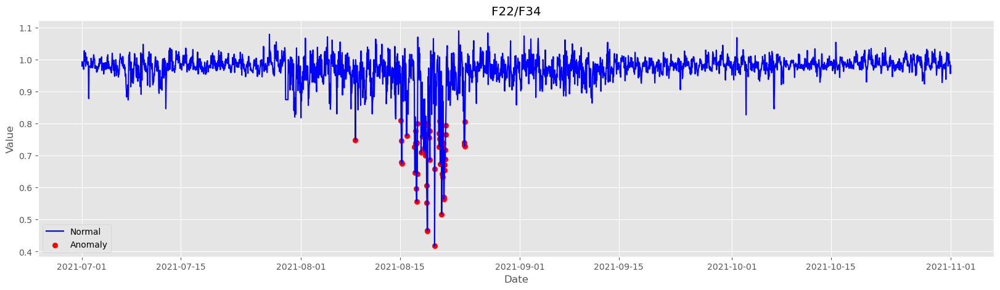

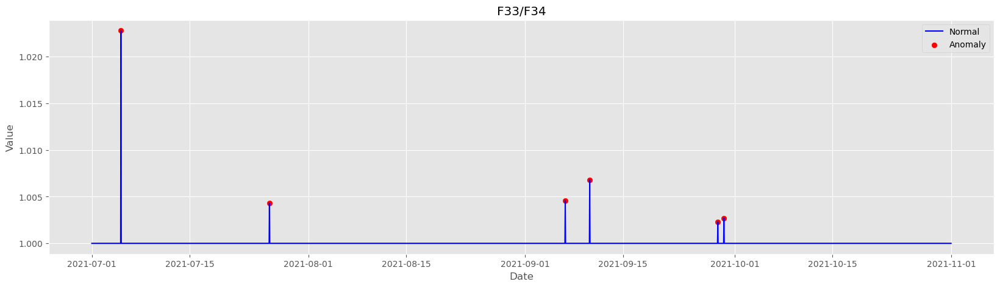

In [8]:
#Zscore METHOD
df1=df.copy()
for col in df1.columns:
    if col != 'col_zscore': 
        #finding zscore
        df1['col_zscore'] = ((df1[col] - df1[col].mean())/df1[col].std(ddof=0))

        #defining the threshold
        lower_bound = -3
        upper_bound = 3
        
        #detecting anomalies
        outlier = [x for x in df1['col_zscore'] if  ((x > upper_bound)|(x<lower_bound))]
        anomalies = df1.loc[df1['col_zscore'].isin(outlier)]
    
        top_n = int(np.ceil(len(df1) * 2 / 100))
        top_n_outliers = anomalies.sort_values(by=col, ascending = False).head(top_n)
    
        # plot results
        fig, ax = plt.subplots(figsize=(20,5))
        ax.plot(df1.index, df1[col], color='blue', label='Normal')
        ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
        plt.title(col)
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend()
    
        col_name = col.replace("/", " divided by ")
        plt.savefig(col_name + '_zscore_plot.png')
    
        plt.show()

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import t
from math import sqrt

In [10]:
#GRUBBS_TEST
def grubbs_test(df, col, alpha):
    outliers = []
    data = df[col]
    n = len(data)
    mean = np.mean(data)
    std = np.std(data)
    t_critical = t.ppf(1 - alpha / (2 * n), n - 2)
    threshold = (n - 1) / sqrt(n) * sqrt(t_critical ** 2 / (n - 2 + t_critical ** 2))
    while True:
        G = np.abs(data - mean) / std  # calculated
        max_idx = np.argmax(G)
        if G[max_idx] > threshold:
            outliers.append(max_idx)
            try:
                data = np.delete(data, max_idx)
                n -= 1
                mean = np.mean(data)
                std = np.std(data)
                threshold = (n - 1) / np.sqrt(n) * np.sqrt((t.ppf(1 - alpha / (2 * n), n - 2) ** 2) / (n - 2 + t.ppf(1 - alpha / (2 * n), n - 2) ** 2))
            except ValueError:
                break
        else:
            break
    return outliers

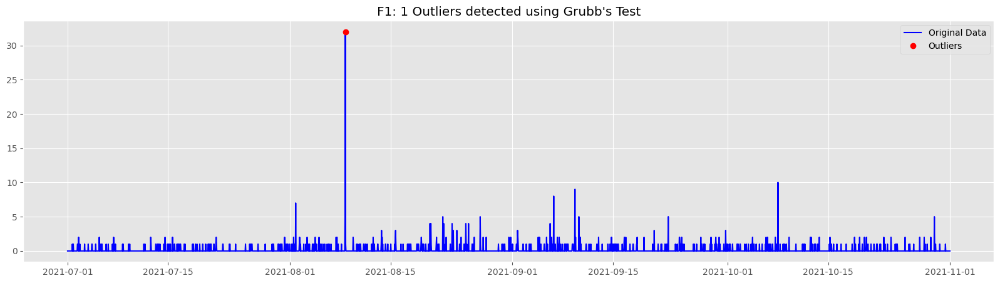

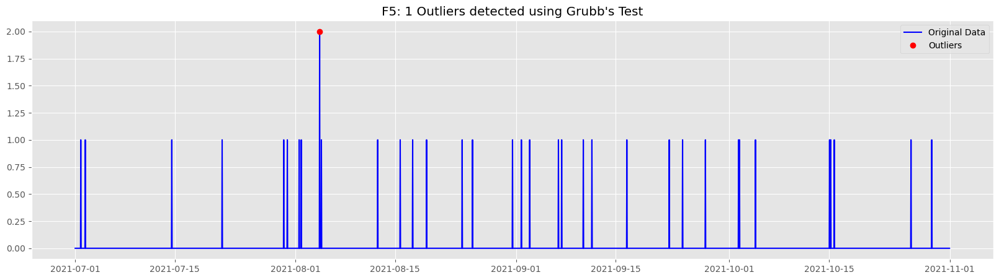

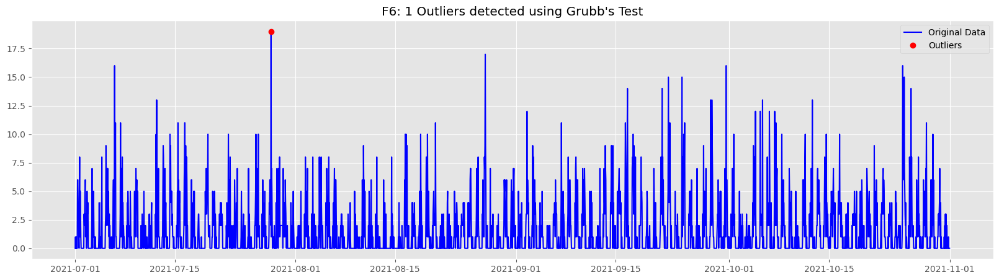

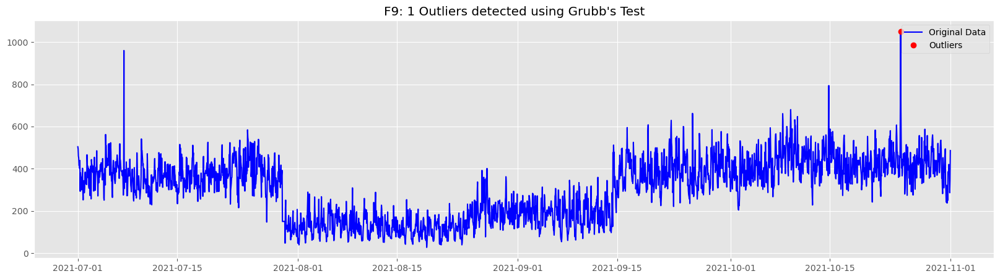

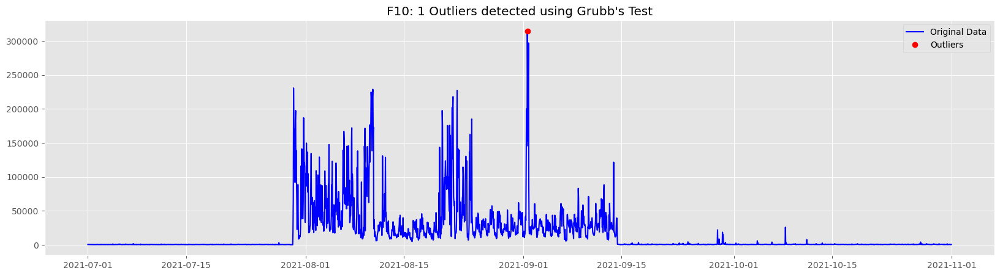

...

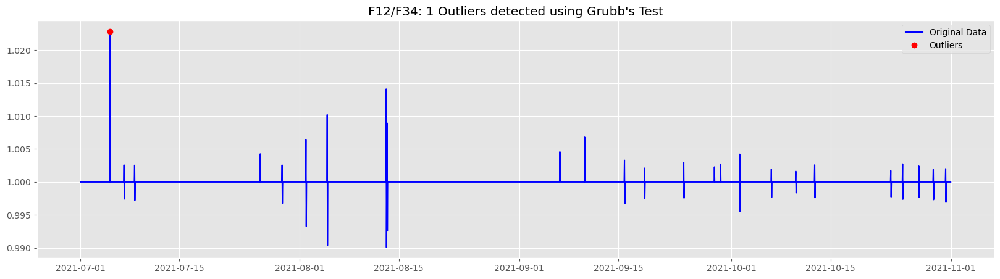

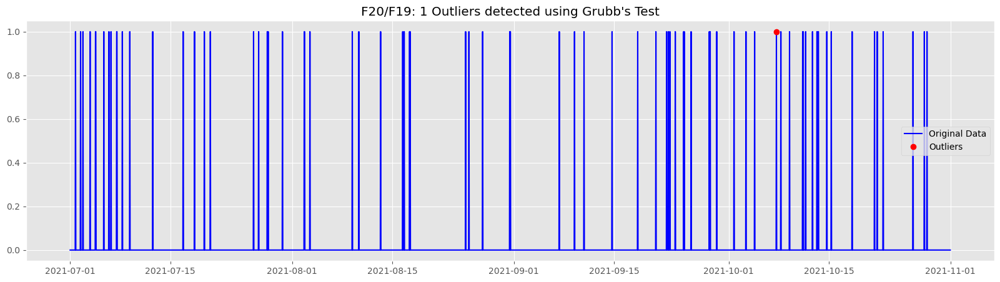

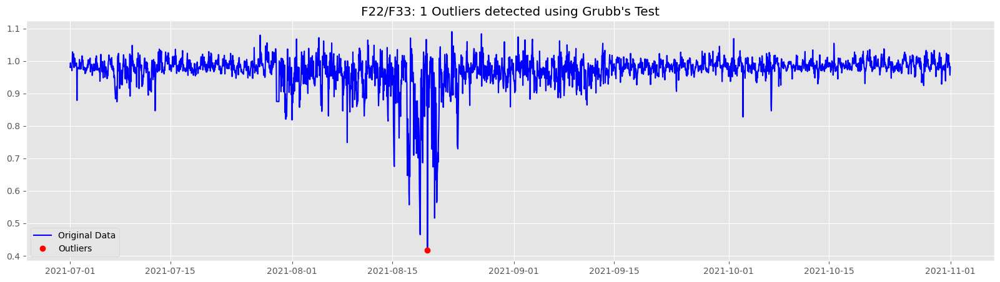

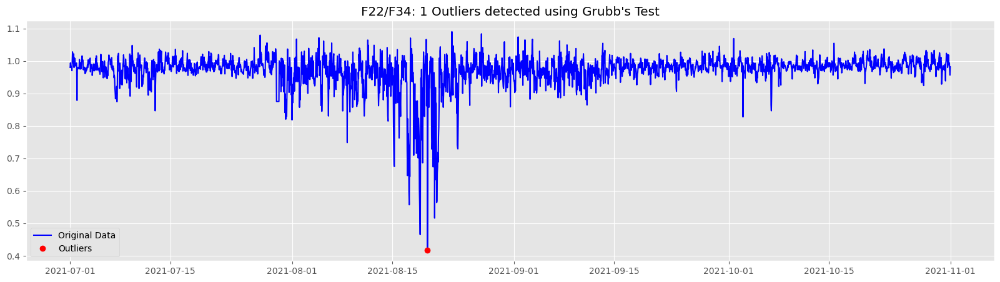

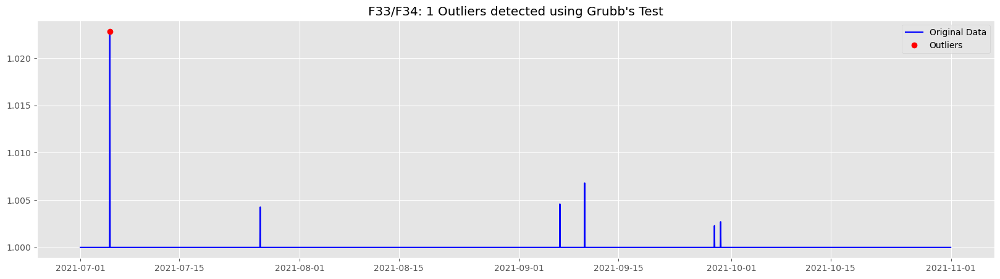

In [11]:
data = pd.read_csv('C:\\Users\\Admin\\OneDrive\\Desktop\\HPE\\feature_seln_new123.csv',parse_dates=['START_TIME'])
df=data[data.columns[1:]]
plt.rcParams['figure.figsize'] = [20, 5]
alpha = 0.02
for col in df.columns:
    if col!= 'START_TIME':
        outliers = grubbs_test(df, col, alpha)
        fig, ax = plt.subplots()
        ax.plot(df['START_TIME'], df[col], label='Original Data',color='blue')
        if outliers:
            ax.plot(df['START_TIME'][outliers], df[col][outliers], 'ro', label='Outliers')
            ax.legend()
            plt.title(f"{col}: {len(outliers)} Outliers detected using Grubb's Test")
        else:
            plt.title(f"{col}: No Outliers detected using Grubb's Test")
        col_name = col.replace("/", " divided by ")
        plt.savefig(col_name + '_grubbs_plot.png')
        plt.show()

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [13]:
data = pd.read_csv('C:\\Users\\Admin\\OneDrive\\Desktop\\HPE\\feature_seln_new123.csv', parse_dates=['START_TIME'], index_col='START_TIME')
df=data[data.columns[1:]]

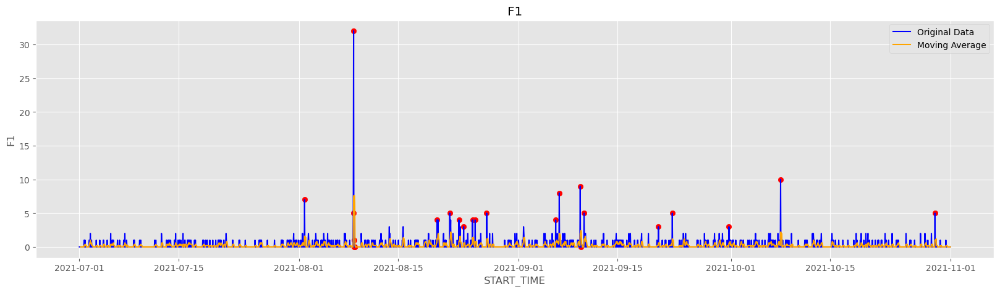

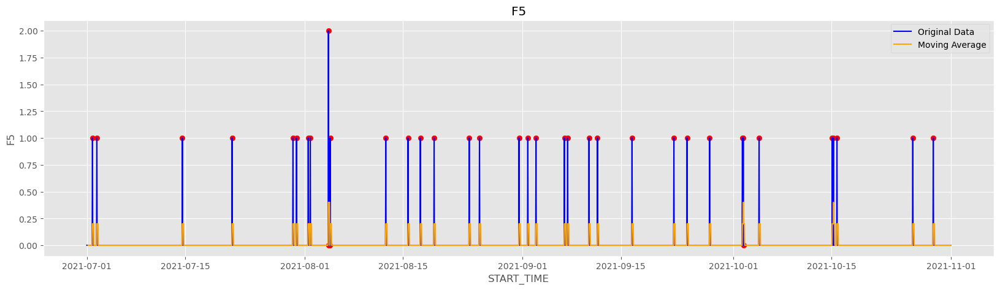

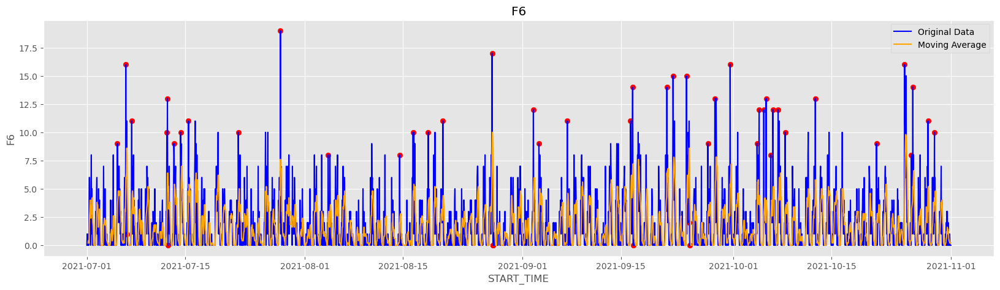

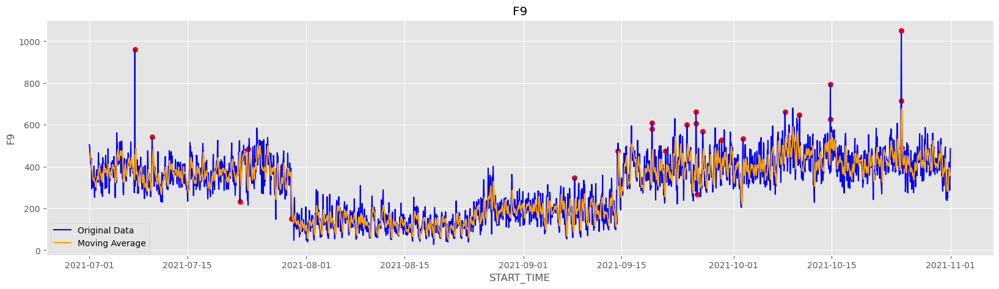

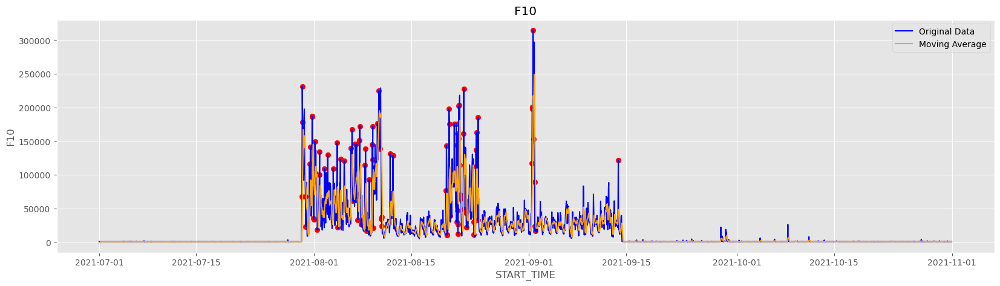

...

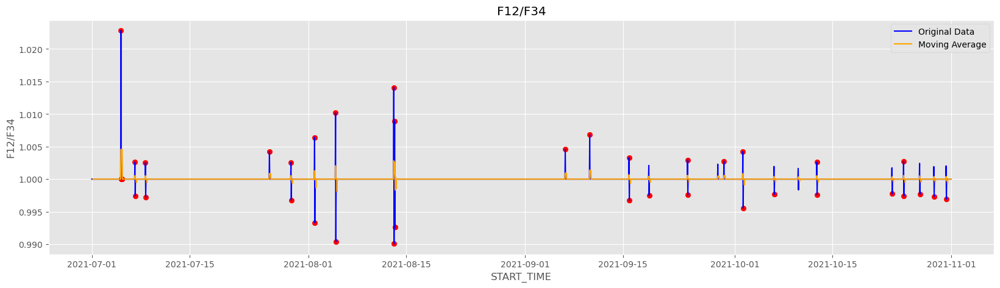

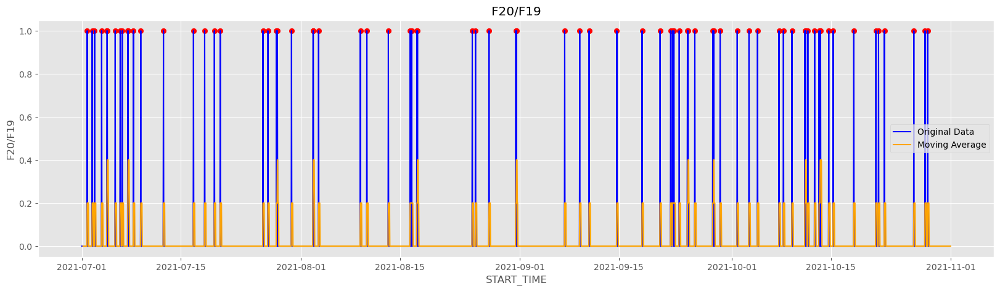

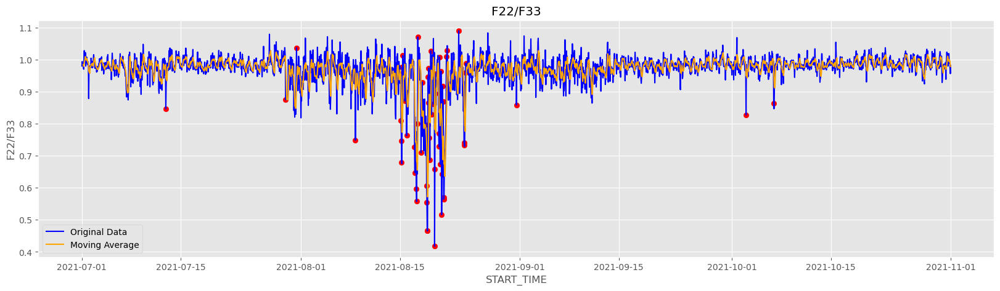

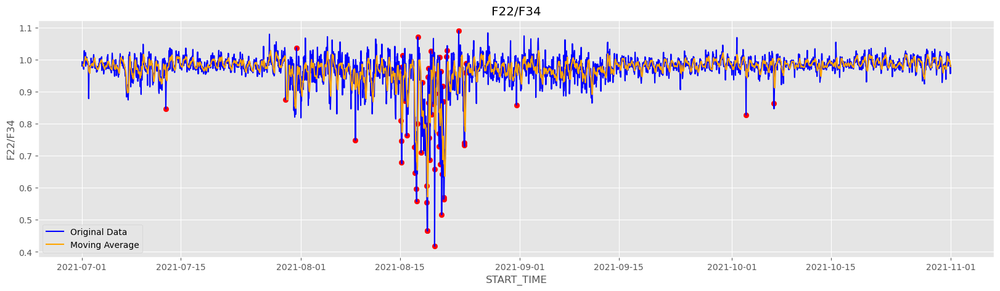

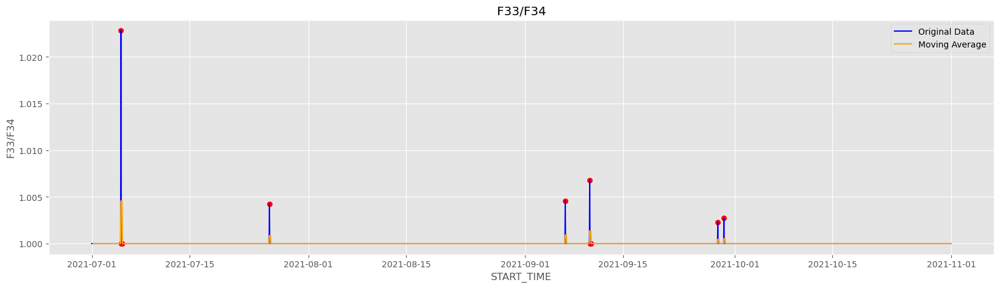

In [14]:
#MOVING AVERAGE METHOD
# calculate the rolling mean using a window of 5 periods
plt.rcParams['figure.figsize'] = [20, 5]
for col in df.columns:
    rolling_mean = df[col].rolling(window=5).mean()
    diff = df[col] - rolling_mean
    std = np.std(diff)
    threshold = 3 * std
    plt.plot(df.index, df[col], label='Original Data',color='blue')
    plt.plot(rolling_mean.index, rolling_mean, label='Moving Average', color='orange')
    plt.legend(loc='best')
    anomalies = diff.abs() > threshold
    plt.scatter(df.index[anomalies], df[col][anomalies], color='red', label='Anomalies')
    plt.title(col)
    plt.xlabel('START_TIME')
    plt.ylabel(col)
    col_name = col.replace("/", " divided by ")
    plt.savefig(col_name + '_moving_average_plot.png')
    plt.show()